In [134]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import geopandas as gpd
import seaborn as sns

In [135]:
hood = gpd.read_file("Community_Planning_Areas.geojson")

In [136]:
df = pd.read_csv("NeighborhoodAgePercentages.csv") # formatted such that 1% is written as 1.00 instead of 0.01
df = df.set_index("Name") # sets the Name column as the index
df1 = df[0:27] # we are going to ignore the final row

df2 = df[27:] # want to separate the city totals

print(df1)
print(df2)

                        Pre-1920  1920 - 1930  1930 -1940  1940 - 1950  \
Name                                                                     
Far Northwest           0.236455     0.051403    0.030842     0.102807   
Rocky Fork-Blacklick    0.409510     0.079627    0.147879     0.227505   
Northland               0.130584     0.247423    0.171821     0.804124   
Northwest               0.231399     0.249199    0.160199     0.338199   
South Linden            5.366057    15.765391    2.641431    14.850250   
Eastmoor/Walnut Ridge   0.541449     2.165795    1.624347     7.225541   
Westland                0.971830     0.492481    0.636943     1.011229   
Near East              61.970218    13.888889    2.176403     6.872852   
Northeast               0.763359     1.853871    0.472555     4.471101   
Far East                0.162778     0.162778    0.217037     0.253210   
West Scioto             0.118273     0.137985    0.118273     0.473093   
Near North/University  71.179731    10

In [137]:
df1s = df1.stack() # rearranging dataframe into the preferred format
df2s = df2.stack()
df1s.head(20) # nice but the column names are non-existent for the last two columns

Name                             
Far Northwest         Pre-1920        0.236455
                      1920 - 1930     0.051403
                      1930 -1940      0.030842
                      1940 - 1950     0.102807
                      1950 - 1960     1.901922
                      1960 - 1970     3.515986
                      1970 - 1980    23.439910
                      1980 - 1990    52.441657
                      1990 - 2000     8.018916
                      2000 - 2024    10.260101
Rocky Fork-Blacklick  Pre-1920        0.409510
                      1920 - 1930     0.079627
                      1930 -1940      0.147879
                      1940 - 1950     0.227505
                      1950 - 1960     0.614265
                      1960 - 1970     1.035150
                      1970 - 1980     3.537709
                      1980 - 1990     9.987487
                      1990 - 2000    27.676032
                      2000 - 2024    56.284837
dtype: float64

In [138]:
# Converting DataFrame and renaming columns into useful terms
stacked_df = df1s.reset_index()
stacked_df.columns = ['Neighborhood', 'Years', 'Percentage of Homes']

stacked_df2 = df2s.reset_index()
stacked_df2.columns = ['Neighborhood', 'Years', 'Percentage of Homes']

print(stacked_df)
print(stacked_df2)

      Neighborhood        Years  Percentage of Homes
0    Far Northwest     Pre-1920             0.236455
1    Far Northwest  1920 - 1930             0.051403
2    Far Northwest   1930 -1940             0.030842
3    Far Northwest  1940 - 1950             0.102807
4    Far Northwest  1950 - 1960             1.901922
..             ...          ...                  ...
265   Rickenbacker  1960 - 1970            10.149806
266   Rickenbacker  1970 - 1980             6.833866
267   Rickenbacker  1980 - 1990             5.975425
268   Rickenbacker  1990 - 2000            22.235314
269   Rickenbacker  2000 - 2024            53.728329

[270 rows x 3 columns]
  Neighborhood        Years  Percentage of Homes
0     Columbus     Pre-1920             6.365599
1     Columbus  1920 - 1930             6.196968
2     Columbus   1930 -1940             2.262244
3     Columbus  1940 - 1950             5.807511
4     Columbus  1950 - 1960            17.243195
5     Columbus  1960 - 1970            13.2589

In [139]:
df2_sea = stacked_df2[["Years","Percentage of Homes"]]
print(df2_sea)

         Years  Percentage of Homes
0     Pre-1920             6.365599
1  1920 - 1930             6.196968
2   1930 -1940             2.262244
3  1940 - 1950             5.807511
4  1950 - 1960            17.243195
5  1960 - 1970            13.258951
6  1970 - 1980             9.854210
7  1980 - 1990            10.730824
8  1990 - 2000            14.122182
9  2000 - 2024            14.158317


In [140]:
stacked_df = stacked_df.round(2)
stacled_df2 = stacked_df2.round(2)
print(stacked_df)
print(stacked_df2)

      Neighborhood        Years  Percentage of Homes
0    Far Northwest     Pre-1920                 0.24
1    Far Northwest  1920 - 1930                 0.05
2    Far Northwest   1930 -1940                 0.03
3    Far Northwest  1940 - 1950                 0.10
4    Far Northwest  1950 - 1960                 1.90
..             ...          ...                  ...
265   Rickenbacker  1960 - 1970                10.15
266   Rickenbacker  1970 - 1980                 6.83
267   Rickenbacker  1980 - 1990                 5.98
268   Rickenbacker  1990 - 2000                22.24
269   Rickenbacker  2000 - 2024                53.73

[270 rows x 3 columns]
  Neighborhood        Years  Percentage of Homes
0     Columbus     Pre-1920             6.365599
1     Columbus  1920 - 1930             6.196968
2     Columbus   1930 -1940             2.262244
3     Columbus  1940 - 1950             5.807511
4     Columbus  1950 - 1960            17.243195
5     Columbus  1960 - 1970            13.2589

In [141]:
#"Community_Planning_Areas.geojson"
fig=px.choropleth_map(stacked_df,
             geojson=hood,
             featureidkey='properties.PLAN_AREA_NAME',   
             locations='Neighborhood',        #column in dataframe
              animation_frame='Years',       #dataframe
              color='Percentage of Homes',  #dataframe
              color_continuous_scale='Inferno',
               title="Home Build Year Spatial Distribution",#(Pre-1920s - 2024)",
               #projection="mercator",
               center={"lat": 40, "lon": -83.02}, 
               map_style="carto-positron",zoom=9.5,
               width=850,
               height=750,
               hover_name="Neighborhood",hover_data={"Years":False,"Neighborhood":False},
               labels = {'Percentage of Homes':"% of Buildings "},
              )
fig.update_layout(title_x=0.5,margin={"r":0,"t":40,"l":0,"b":0})
fig.update_geos(fitbounds="locations", visible=False)
fig.show()

#labels={'unemp':'unemployment rate'}

In [142]:
# Bar chart
fig=px.bar(stacked_df,x="Neighborhood",y="Percentage of Homes",color="Neighborhood",animation_frame='Years',barmode='group',height=500,range_y=[0,75])
fig.update_layout(margin={"r":0,"t":5,"l":0,"b":200})
fig.update_traces(width=1)

In [143]:
# Bar chart
fig=px.bar(stacked_df,x="Years",y="Percentage of Homes",animation_frame='Neighborhood',height=500,range_y=[0,75])
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":100},
                  yaxis=dict(
            title=dict(
            text="Percentage of Homes",
            font=dict(size=20)
        ),
        ticktext=["0 %", "10 %", "20 %", "30 %","40 %", "50 %", "60 %", "70 %"],
        tickvals=[0, 10, 20, 30, 40, 50, 60, 70],
        tickmode="array"
    ))
    #plot_bgcolor="grey")#,
    #grid='black')

In [144]:
df_homes = pd.read_csv("df_cleaned.csv")
df_homes.head()

C:\Users\Brock\AppData\Local\Temp\ipykernel_44756\2770444219.py:1: DtypeWarning:

Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.



,Unnamed: 0,PARCEL ID,YEARBLT,APPRTOT,PRICE,GRADE,Street Number,Street Name,City,Zip Code,County,Latitude,Longitude,System-Owned Pipe Classification,Previously Lead?,Customer-Owned Pipe Classification
0,0,010-095828,1952,101600,0.0,D+2,1160,ABERDEEN AVE,COLUMBUS,43211-1342,FRANKLIN,40.021579,-82.980427,CU,Y,GAL
1,1,010-076087,1924,103400,0.0,D+1,1173,ABERDEEN AVE,COLUMBUS,43211-1341,FRANKLIN,40.021254,-82.980054,CU,Y,GAL
2,2,010-076101,1927,99500,0.0,D+1,1237,ABERDEEN AVE,COLUMBUS,43211-1341,FRANKLIN,40.021125,-82.978349,CU,Y,GAL
3,3,010-059808,1950,95900,0.0,D+2,1282,ABERDEEN AVE,COLUMBUS,43211-1344,FRANKLIN,40.021415,-82.977124,CU,Y,GAL
4,4,010-042707,1900,163500,19500.0,C,1304,ABERDEEN AVE,COLUMBUS,43211-1344,FRANKLIN,40.021370,-82.976541,CU,Y,GAL


In [145]:
df_homes1 = df_homes.rename(columns={"System-Owned Pipe Classification ":"SO_Pipe_Class","Customer-Owned Pipe Classification":"CO_Pipe_Class"})


In [146]:
df_homesPB = df_homes1.query("SO_Pipe_Class == 'PB'")   # Lead
df_homesGAL = df_homes1.query("SO_Pipe_Class == 'GAL'") # Galvinized Steel (Likely contains lead particles)
df_homesCU = df_homes1.query("SO_Pipe_Class == 'CU'")   # Copper (no lead)
df_homesPL = df_homes1.query("SO_Pipe_Class == 'PL'")   # Plastic (no lead)
df_homesOT = df_homes1.query("SO_Pipe_Class == 'OT'")   # Other (no lead)
df_homesMU = df_homes1.query("SO_Pipe_Class == 'MU'")   # Material Unknown (no lead)

# Can use pandas logic to filter out specific rows (e.g. Logical and is 'and', Logical or is 'or', and Logical not is '!=')

df_homesPBGAL = df_homes1.query("SO_Pipe_Class == 'PB' or SO_Pipe_Class == 'GAL'") # Includes Lead & Galvinized Steel rows
df_homesNonPB = df_homes1.query("SO_Pipe_Class != 'PB' or SO_Pipe_Class != 'GAL'") # Ignores all rows containing Lead or Galvinized Steel

# Want to replace all non-lead classifications with 'Non-PB'
df_homes1.loc[(df_homes1['SO_Pipe_Class'] != 'PB'), 'SO_Pipe_Class'] = 'Non-PB'
df_homes1.head()

# Option 2: Using .where() for Conditional Replacement

# Replace values in column 'SO_Pipe_Class' where the condition is NOT met
#df_homes1['SO_Pipe_Class'] = np.where((df_homes1['SO_Pipe_Class'] == 'PB') | (df_homes1['SO_Pipe_Class'] == 'CU'), 'Lead','Non-Lead')
#print(df_homes1)



,Unnamed: 0,PARCEL ID,YEARBLT,APPRTOT,PRICE,GRADE,Street Number,Street Name,City,Zip Code,County,Latitude,Longitude,SO_Pipe_Class,Previously Lead?,CO_Pipe_Class
0,0,010-095828,1952,101600,0.0,D+2,1160,ABERDEEN AVE,COLUMBUS,43211-1342,FRANKLIN,40.021579,-82.980427,Non-PB,Y,GAL
1,1,010-076087,1924,103400,0.0,D+1,1173,ABERDEEN AVE,COLUMBUS,43211-1341,FRANKLIN,40.021254,-82.980054,Non-PB,Y,GAL
2,2,010-076101,1927,99500,0.0,D+1,1237,ABERDEEN AVE,COLUMBUS,43211-1341,FRANKLIN,40.021125,-82.978349,Non-PB,Y,GAL
3,3,010-059808,1950,95900,0.0,D+2,1282,ABERDEEN AVE,COLUMBUS,43211-1344,FRANKLIN,40.021415,-82.977124,Non-PB,Y,GAL
4,4,010-042707,1900,163500,19500.0,C,1304,ABERDEEN AVE,COLUMBUS,43211-1344,FRANKLIN,40.021370,-82.976541,Non-PB,Y,GAL


In [147]:
fig = px.scatter_map(df_homes, lat="Latitude", lon="Longitude", color="YEARBLT",
                  color_continuous_scale=px.colors.cyclical.IceFire_r, size_max=0.1, zoom=10,height=700,
                  map_style="carto-positron",range_color=[1900,2024])
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

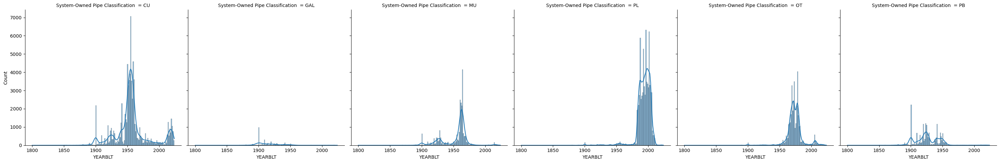

In [148]:
sns.displot(data=df_homes, x="YEARBLT",col="System-Owned Pipe Classification ",kde=True)

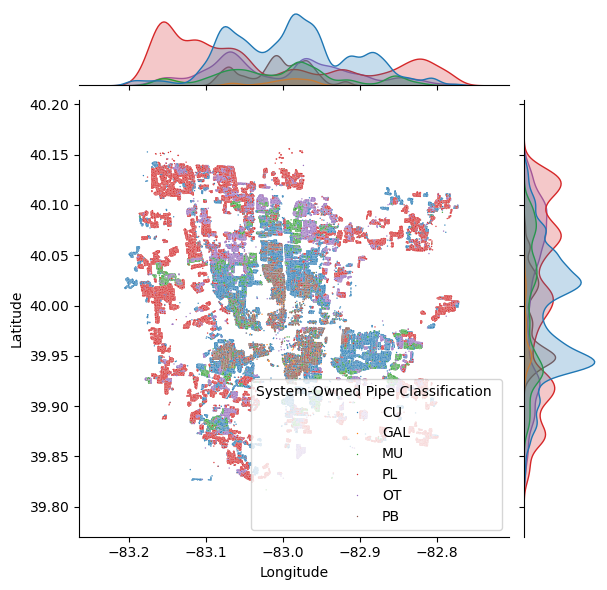

In [149]:
sns.jointplot(data=df_homes, x="Longitude", y="Latitude", hue="System-Owned Pipe Classification ",s=1)

<Figure size 800x600 with 0 Axes>

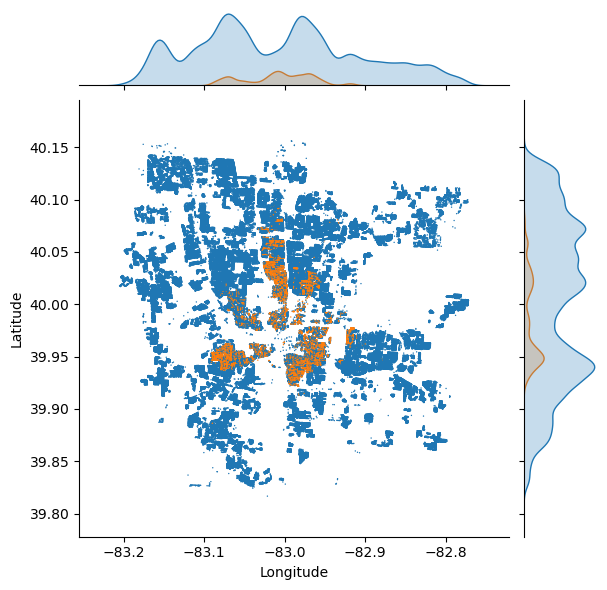

In [150]:
plt.figure(figsize=(8, 6))
g = sns.jointplot(data=df_homes1, x="Longitude", y="Latitude",hue="SO_Pipe_Class",s=1,joint_kws={'edgecolor':'none'})
                  #,kind="scatter",
    #scatter_kws={"edgecolor": "none"})
g.ax_joint.legend_.remove()
#plt.savefig("PBvsNonPB_seaborn_plot.png", dpi=600, facecolor="white")